# Phase 1 - Visualização dos Resultados 

Este notebook carrega o modelo treinado do Phase 1 (autoencoder) e visualiza os resultados da reconstrução em imagens de teste que não foram usadas no treinamento.

In [1]:
import torch
import torch.nn as nn
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import torchvision.transforms as transforms
from pathlib import Path
import random

# Configurações
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Usando device: {device}")

Usando device: cuda


## 1. Carregar o Modelo

In [ ]:
from models.ssmd_unet_optimized import SSMDUNetPhase1

# Inicializar modelo
model = SSMDUNetPhase1()
model = model.to(device)

# Carregar checkpoint da época 70
checkpoint_path = '/home/lucas/mestrado/tapi_inrid/checkpoints/phase1/phase1_epoch_70.pth'
checkpoint = torch.load(checkpoint_path, map_location=device)

# Carregar state_dict do modelo completo (model_state contém encoder + decoder_rec)
model.load_state_dict(checkpoint['model_state'])
model.eval()

epoch = checkpoint['epoch']
print(f"Modelo carregado da época {epoch}")
print(f"Train losses: {len(checkpoint['train_losses'])} épocas")
print(f"Val losses: {len(checkpoint['val_losses'])} épocas")

## 2. Preparar Transformações e Carregar Imagens de Teste

In [10]:
# Transformações (mesmas usadas no treinamento - SEM normalização ImageNet!)
# O treinamento usou imagens pré-processadas que estão apenas em [0, 1]
transform = transforms.Compose([
    transforms.Resize((512, 512)),
    transforms.ToTensor(),  # Apenas converte para tensor [0, 1]
    # NÃO usar Normalize aqui! O modelo foi treinado sem normalização ImageNet
])

# Caminho das imagens de teste
test_dir = Path('/home/lucas/mestrado/tapi_inrid/eye_pacs/data/test')
test_images = sorted(list(test_dir.glob('*.jpeg')))

print(f"Encontradas {len(test_images)} imagens de teste")

# Selecionar 12 imagens aleatórias para visualização
random.seed(42)
sample_images = random.sample(test_images, min(12, len(test_images)))
print(f"Selecionadas {len(sample_images)} imagens para visualização")

Encontradas 53576 imagens de teste
Selecionadas 12 imagens para visualização


## 3. Função para Denormalizar Imagens

In [11]:
def tensor_to_numpy(tensor):
    """
    Converte tensor PyTorch para numpy array (H, W, C).
    Como as imagens já estão em [0, 1], apenas converte.
    """
    return tensor.permute(1, 2, 0).cpu().numpy()

## 4. Inferência e Visualização

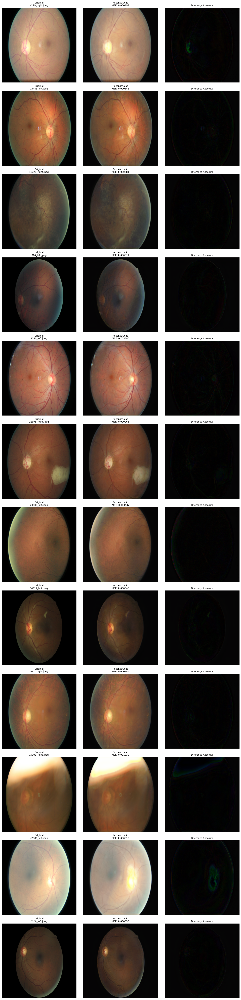


Visualização salva em: phase1_epoch70_results.png


In [12]:
# Configurar figura para grid 3 colunas x N linhas
n_samples = len(sample_images)
fig, axes = plt.subplots(n_samples, 3, figsize=(15, 5 * n_samples))

if n_samples == 1:
    axes = axes.reshape(1, -1)

with torch.no_grad():
    for idx, img_path in enumerate(sample_images):
        # Carregar e transformar imagem
        original_img = Image.open(img_path).convert('RGB')
        input_tensor = transform(original_img).unsqueeze(0).to(device)
        
        # Fazer reconstrução
        reconstruction = model(input_tensor)
        
        # Calcular diferença absoluta (já em [0, 1])
        diff = torch.abs(input_tensor - reconstruction)
        
        # Converter para numpy
        input_np = tensor_to_numpy(input_tensor.squeeze(0))
        recon_np = tensor_to_numpy(reconstruction.squeeze(0))
        diff_np = tensor_to_numpy(diff.squeeze(0))
        
        # Calcular MSE
        mse = torch.mean((input_tensor - reconstruction) ** 2).item()
        
        # Plotar
        axes[idx, 0].imshow(input_np)
        axes[idx, 0].set_title(f'Original\n{img_path.name}', fontsize=10)
        axes[idx, 0].axis('off')
        
        axes[idx, 1].imshow(recon_np)
        axes[idx, 1].set_title(f'Reconstrução\nMSE: {mse:.6f}', fontsize=10)
        axes[idx, 1].axis('off')
        
        axes[idx, 2].imshow(diff_np)
        axes[idx, 2].set_title('Diferença Absoluta', fontsize=10)
        axes[idx, 2].axis('off')

plt.tight_layout()
plt.savefig('/home/lucas/mestrado/tapi_inrid/phase1_epoch70_results.png', 
            dpi=150, bbox_inches='tight')
plt.show()

print("\nVisualização salva em: phase1_epoch70_results.png")

## 5. Análise Quantitativa

In [13]:
# Avaliar em um batch maior de imagens de teste
n_eval = min(100, len(test_images))
eval_images = random.sample(test_images, n_eval)

mse_scores = []
psnr_scores = []

print(f"\nAvaliando {n_eval} imagens de teste...\n")

with torch.no_grad():
    for img_path in eval_images:
        # Carregar e transformar
        original_img = Image.open(img_path).convert('RGB')
        input_tensor = transform(original_img).unsqueeze(0).to(device)
        
        # Reconstruir
        reconstruction = model(input_tensor)
        
        # Calcular MSE
        mse = torch.mean((input_tensor - reconstruction) ** 2).item()
        mse_scores.append(mse)
        
        # Calcular PSNR
        if mse > 0:
            psnr = 10 * np.log10(1.0 / mse)
            psnr_scores.append(psnr)

# Estatísticas
print(f"MSE Médio: {np.mean(mse_scores):.6f} ± {np.std(mse_scores):.6f}")
print(f"MSE Min: {np.min(mse_scores):.6f}")
print(f"MSE Max: {np.max(mse_scores):.6f}")
print(f"\nPSNR Médio: {np.mean(psnr_scores):.2f} dB ± {np.std(psnr_scores):.2f} dB")
print(f"PSNR Min: {np.min(psnr_scores):.2f} dB")
print(f"PSNR Max: {np.max(psnr_scores):.2f} dB")


Avaliando 100 imagens de teste...

MSE Médio: 0.000441 ± 0.000188
MSE Min: 0.000205
MSE Max: 0.001260

PSNR Médio: 33.85 dB ± 1.51 dB
PSNR Min: 29.00 dB
PSNR Max: 36.88 dB


## 6. Histograma de MSE

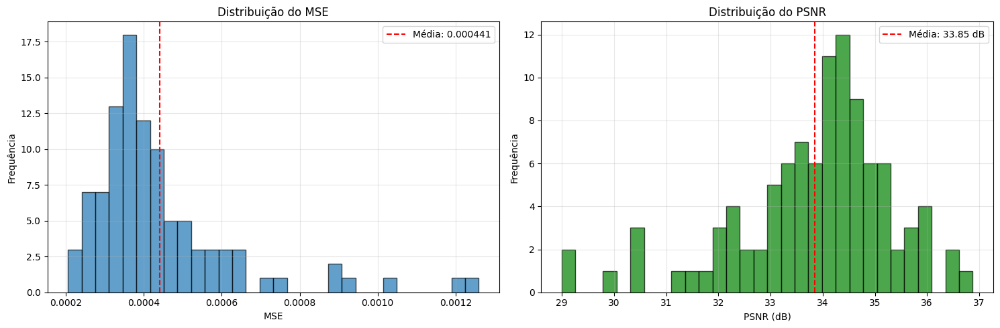


Gráfico de métricas salvo em: phase1_epoch70_metrics.png


In [14]:
fig, axes = plt.subplots(1, 2, figsize=(15, 5))

# Histograma MSE
axes[0].hist(mse_scores, bins=30, edgecolor='black', alpha=0.7)
axes[0].axvline(np.mean(mse_scores), color='red', linestyle='--', 
                label=f'Média: {np.mean(mse_scores):.6f}')
axes[0].set_xlabel('MSE')
axes[0].set_ylabel('Frequência')
axes[0].set_title('Distribuição do MSE')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# Histograma PSNR
axes[1].hist(psnr_scores, bins=30, edgecolor='black', alpha=0.7, color='green')
axes[1].axvline(np.mean(psnr_scores), color='red', linestyle='--', 
                label=f'Média: {np.mean(psnr_scores):.2f} dB')
axes[1].set_xlabel('PSNR (dB)')
axes[1].set_ylabel('Frequência')
axes[1].set_title('Distribuição do PSNR')
axes[1].legend()
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('/home/lucas/mestrado/tapi_inrid/phase1_epoch70_metrics.png', 
            dpi=150, bbox_inches='tight')
plt.show()

print("\nGráfico de métricas salvo em: phase1_epoch70_metrics.png")

## 7. Visualizar Melhores e Piores Reconstruções

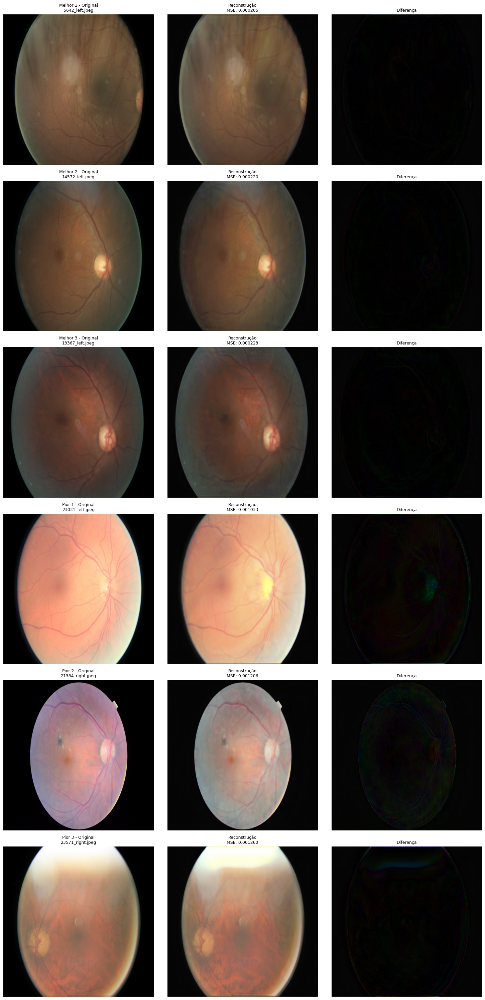


Comparação melhores/piores salva em: phase1_epoch70_best_worst.png


In [15]:
# Encontrar índices das melhores e piores reconstruções
sorted_indices = np.argsort(mse_scores)
best_indices = sorted_indices[:3]  # 3 melhores
worst_indices = sorted_indices[-3:]  # 3 piores

fig, axes = plt.subplots(6, 3, figsize=(15, 30))

def plot_reconstruction(ax_row, img_path, label_prefix):
    with torch.no_grad():
        original_img = Image.open(img_path).convert('RGB')
        input_tensor = transform(original_img).unsqueeze(0).to(device)
        reconstruction = model(input_tensor)
        
        # Calcular diferença absoluta (já em [0, 1])
        diff = torch.abs(input_tensor - reconstruction)
        
        # Converter para numpy
        input_np = tensor_to_numpy(input_tensor.squeeze(0))
        recon_np = tensor_to_numpy(reconstruction.squeeze(0))
        diff_np = tensor_to_numpy(diff.squeeze(0))
        
        mse = torch.mean((input_tensor - reconstruction) ** 2).item()
        
        ax_row[0].imshow(input_np)
        ax_row[0].set_title(f'{label_prefix} - Original\n{img_path.name}', fontsize=9)
        ax_row[0].axis('off')
        
        ax_row[1].imshow(recon_np)
        ax_row[1].set_title(f'Reconstrução\nMSE: {mse:.6f}', fontsize=9)
        ax_row[1].axis('off')
        
        ax_row[2].imshow(diff_np)
        ax_row[2].set_title('Diferença', fontsize=9)
        ax_row[2].axis('off')

# Plotar 3 melhores
for i, idx in enumerate(best_indices):
    plot_reconstruction(axes[i], eval_images[idx], f'Melhor {i+1}')

# Plotar 3 piores
for i, idx in enumerate(worst_indices):
    plot_reconstruction(axes[i+3], eval_images[idx], f'Pior {i+1}')

plt.tight_layout()
plt.savefig('/home/lucas/mestrado/tapi_inrid/phase1_epoch70_best_worst.png', 
            dpi=150, bbox_inches='tight')
plt.show()

print("\nComparação melhores/piores salva em: phase1_epoch70_best_worst.png")

## 8. Resumo Final

In [16]:
print("\n" + "="*60)
print("RESUMO DA AVALIAÇÃO - PHASE 1 (Época 70)")
print("="*60)
print(f"\nModelo: SSMD-UNet Optimized")
print(f"Dataset de Teste: {len(test_images)} imagens (não usadas no treino)")
print(f"Imagens Avaliadas: {n_eval}")
print(f"\nMétricas de Reconstrução:")
print(f"   - MSE: {np.mean(mse_scores):.6f} ± {np.std(mse_scores):.6f}")
print(f"   - PSNR: {np.mean(psnr_scores):.2f} ± {np.std(psnr_scores):.2f} dB")
print(f"\nArquivos Gerados:")
print(f"   - phase1_epoch70_results.png (amostras aleatórias)")
print(f"   - phase1_epoch70_metrics.png (distribuições)")
print(f"   - phase1_epoch70_best_worst.png (melhores e piores)")
print("\n" + "="*60)


RESUMO DA AVALIAÇÃO - PHASE 1 (Época 70)

Modelo: SSMD-UNet Optimized
Dataset de Teste: 53576 imagens (não usadas no treino)
Imagens Avaliadas: 100

Métricas de Reconstrução:
   - MSE: 0.000441 ± 0.000188
   - PSNR: 33.85 ± 1.51 dB

Arquivos Gerados:
   - phase1_epoch70_results.png (amostras aleatórias)
   - phase1_epoch70_metrics.png (distribuições)
   - phase1_epoch70_best_worst.png (melhores e piores)

